In [1]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import streamlit as st
from scipy.stats import chi2_contingency


# Load your data into a pandas DataFrame (assuming your data is in a CSV file)
df = pd.read_csv('hotel_bookings.csv')
df.head()


,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [2]:
df.shape

(119390, 32)

In [3]:
df.isnull().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

We will drop agent and Company columns from our dataset

In [4]:
# Drop the 'agent' and 'company' columns
df = df.drop(columns=['agent', 'company'])

We have 488 missing values in Country column, So we will replace them with the most frequent country

In [5]:
# Replace missing values in 'country' column with the most frequent country
most_frequent_country = df['country'].mode()[0]
df['country'] = df['country'].fillna(most_frequent_country)


In [6]:
df.isnull().sum()

hotel                             0
is_canceled                       0
lead_time                         0
arrival_date_year                 0
arrival_date_month                0
arrival_date_week_number          0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          4
babies                            0
meal                              0
country                           0
market_segment                    0
distribution_channel              0
is_repeated_guest                 0
previous_cancellations            0
previous_bookings_not_canceled    0
reserved_room_type                0
assigned_room_type                0
booking_changes                   0
deposit_type                      0
days_in_waiting_list              0
customer_type                     0
adr                               0
required_car_parking_spaces       0
total_of_special_requests   

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 30 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [8]:
df.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000
mean,0.370416,104.011416,2016.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,0.031912,0.087118,0.137097,0.221124,2.321149,101.831122,0.062518,0.571363
std,0.482918,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,0.175767,0.844336,1.497437,0.652306,17.594721,50.535790,0.245291,0.792798
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,69.290000,0.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,94.575000,0.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,126.000000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,391.000000,5400.000000,8.000000,5.000000


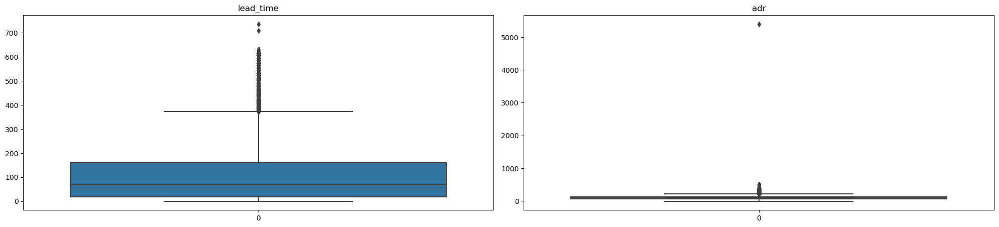

In [9]:
# List of columns to check for outliers
cols_to_check = ['lead_time','adr']

# Plot boxplots for these columns
plt.figure(figsize=(20,30))

for i, column in enumerate(cols_to_check):
    plt.subplot(7, 2, i+1)
    sns.boxplot(df[column])
    plt.title(column)

plt.tight_layout()
plt.show()

Will remove any 0 values from adults column as the dataset should includes bookings where there is at least one adult

In [10]:
# Remove rows where the number of adults is 0
df = df[df['adults'] != 0]
(df['adults'] == 0).any()

False

In [11]:
df.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,118987.000000,118987.000000,118987.000000,118987.000000,118987.000000,118987.00000,118987.000000,118987.000000,118983.000000,118987.000000,118987.000000,118987.000000,118987.000000,118987.000000,118987.000000,118987.000000,118987.000000,118987.000000
mean,0.370755,104.070537,2016.156362,27.164144,15.796768,0.92695,2.499046,1.862691,0.100435,0.007950,0.031550,0.087337,0.137343,0.218528,2.325565,102.008076,0.062654,0.570642
std,0.483009,106.890775,0.707742,13.598809,8.781186,0.99527,1.897763,0.570060,0.390222,0.097473,0.174799,0.845693,1.499527,0.638088,17.614198,50.448822,0.245544,0.792400
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.00000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.00000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,69.500000,0.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.00000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,95.000000,0.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.00000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,126.000000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.00000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,18.000000,391.000000,5400.000000,8.000000,5.000000


In [12]:
df['adr'].median()

95.0

The 'adr' column has a minimum value of -6.38, which doesn't make sense in this context as the average daily rate should not be negative. The maximum value is 5400, which is quite high compared to the mean (101.83) and median (95.0), suggesting it's an outlier.


In [13]:
# Replace the minimum and maximum values in 'adr' column with the median
adr_median = df['adr'].median()
adr_min = df['adr'].min()
adr_max = df['adr'].max()

df.loc[df['adr'] == adr_min, 'adr'] = adr_median
df.loc[df['adr'] == adr_max, 'adr'] = adr_median

df.describe(include='all')

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
count,118987,118987.000000,118987.000000,118987.000000,118987,118987.000000,118987.000000,118987.00000,118987.000000,118987.000000,...,118987,118987.000000,118987,118987.000000,118987,118987.000000,118987.000000,118987.000000,118987,118987
unique,2,NaN,NaN,NaN,12,NaN,NaN,NaN,NaN,NaN,...,11,NaN,3,NaN,4,NaN,NaN,NaN,3,926
top,City Hotel,NaN,NaN,NaN,August,NaN,NaN,NaN,NaN,NaN,...,A,NaN,No Deposit,NaN,Transient,NaN,NaN,NaN,Check-Out,2015-10-21
freq,78940,NaN,NaN,NaN,13829,NaN,NaN,NaN,NaN,NaN,...,73983,NaN,104238,NaN,89337,NaN,NaN,NaN,74872,1460
mean,NaN,0.370755,104.070537,2016.156362,NaN,27.164144,15.796768,0.92695,2.499046,1.862691,...,NaN,0.218528,NaN,2.325565,NaN,101.964343,0.062654,0.570642,NaN,NaN
std,NaN,0.483009,106.890775,0.707742,NaN,13.598809,8.781186,0.99527,1.897763,0.570060,...,NaN,0.638088,NaN,17.614198,NaN,48.052934,0.245544,0.792400,NaN,NaN
min,NaN,0.000000,0.000000,2015.000000,NaN,1.000000,1.000000,0.00000,0.000000,1.000000,...,NaN,0.000000,NaN,0.000000,NaN,0.000000,0.000000,0.000000,NaN,NaN
25%,NaN,0.000000,18.000000,2016.000000,NaN,16.000000,8.000000,0.00000,1.000000,2.000000,...,NaN,0.000000,NaN,0.000000,NaN,69.500000,0.000000,0.000000,NaN,NaN
50%,NaN,0.000000,69.000000,2016.000000,NaN,28.000000,16.000000,1.00000,2.000000,2.000000,...,NaN,0.000000,NaN,0.000000,NaN,95.000000,0.000000,0.000000,NaN,NaN
75%,NaN,1.000000,160.000000,2017.000000,NaN,38.000000,23.000000,2.00000,3.000000,2.000000,...,NaN,0.000000,NaN,0.000000,NaN,126.000000,0.000000,1.000000,NaN,NaN


Create a map for Seasons and Weekdays name for our data analysis and visualization

In [14]:
import calendar
from datetime import datetime

# Map from month to season (for Northern hemisphere)
seasons = {
    'Winter': ['December', 'January', 'February'],
    'Spring': ['March', 'April', 'May'],
    'Summer': ['June', 'July', 'August'],
    'Autumn': ['September', 'October', 'November']
}

# Function to map a month to a season
def month_to_season(month):
    for season, months in seasons.items():
        if month in months:
            return season

# Create 'season' column
df['season'] = df['arrival_date_month'].apply(month_to_season)

# Create 'day_of_week' column
df['date'] = df.apply(lambda row: datetime.strptime(f"{int(row['arrival_date_year'])} {row['arrival_date_month']} {int(row['arrival_date_day_of_month'])}", "%Y %B %d"), axis=1)
df['day_of_week'] = df['date'].dt.day_name()

# Drop the 'date' column as we no longer need it
df = df.drop(columns=['date'])



Creating a map for Single, couples and family.
'Single': Bookings with one adult, no children, and no babies.
'Couple': Bookings with two adults, no children, and no babies.
'Family': Bookings with two or more adults, and at least one child or baby.
'Other': All other bookings.

In [15]:
# Function to categorize group type
def guest_type(row):
    if row['adults'] == 1 and row['children'] == 0 and row['babies'] == 0:
        return 'Single'
    elif row['adults'] == 2 and row['children'] == 0 and row['babies'] == 0:
        return 'Couple'
    elif row['adults'] > 2 and row['children'] == 0 and row['babies'] == 0:
        return 'Group'
    else:
        return 'Family'

# Apply the function to the dataframe
df['guest_type'] = df.apply(guest_type, axis=1)

# Display the first few rows of the dataframe to confirm
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,season,day_of_week,guest_type
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,0,Transient,0.0,0,0,Check-Out,2015-07-01,Summer,Wednesday,Couple
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,0,Transient,0.0,0,0,Check-Out,2015-07-01,Summer,Wednesday,Couple
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,0,Transient,75.0,0,0,Check-Out,2015-07-02,Summer,Wednesday,Single
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,0,Transient,75.0,0,0,Check-Out,2015-07-02,Summer,Wednesday,Single
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,0,Transient,98.0,0,1,Check-Out,2015-07-03,Summer,Wednesday,Couple


In [16]:
df.to_csv('final_hotel_bookings.csv', index=False)

df = pd.read_csv('final_hotel_bookings.csv')

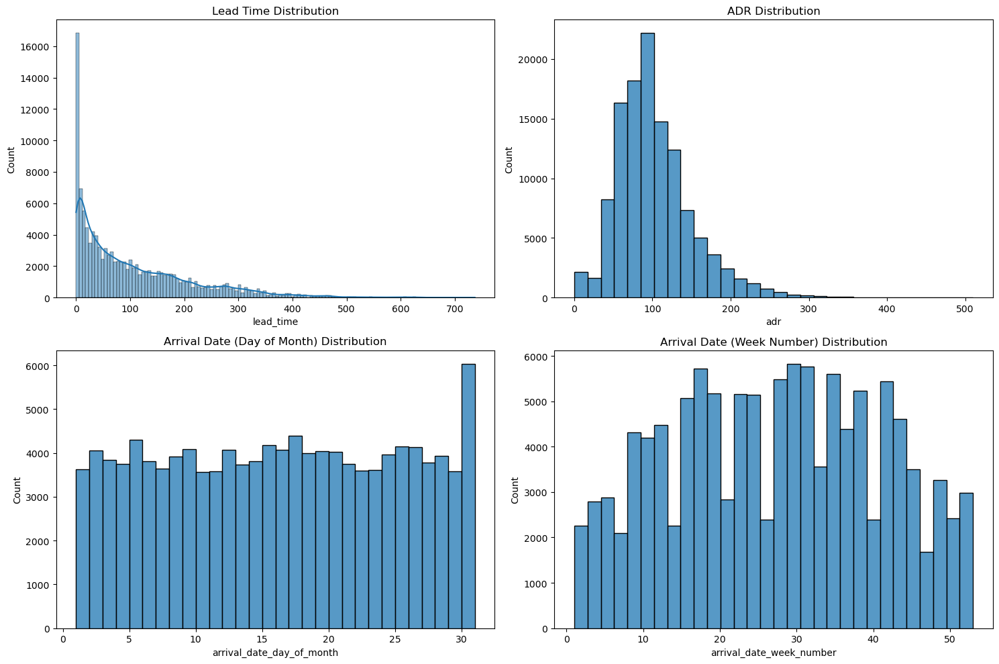

In [17]:
# Plot the distribution of some key numerical variables
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Lead time
sns.histplot(df['lead_time'], kde=True, ax=axes[0, 0])
axes[0, 0].set_title('Lead Time Distribution')

# Average Daily Rate
sns.histplot(df['adr'], kde=False, bins=30, ax=axes[0, 1])
axes[0, 1].set_title('ADR Distribution')

# Arrival Date (Day of Month)
sns.histplot(df['arrival_date_day_of_month'], kde=False, bins=30, ax=axes[1, 0])
axes[1, 0].set_title('Arrival Date (Day of Month) Distribution')

# Arrival Date (Week Number)
sns.histplot(df['arrival_date_week_number'], kde=False, bins=30, ax=axes[1, 1])
axes[1, 1].set_title('Arrival Date (Week Number) Distribution')

plt.tight_layout()
plt.show()


1- Lead Time Distribution: Most of the bookings have a lead time of less than 200 days. However, there are bookings with a lead time of up to 700 days.

2- ADR (Average Daily Rate) Distribution: The ADR has a somewhat right-skewed distribution, with most of the rates less than 200. However, there are a few bookings with a higher rate.

3- Arrival Date (Day of Month) Distribution: The arrival day of the month is fairly distributed, with slight dips at the end of the month. except for the end of the month, which shows that we recieve a higher number of guests by the end of each month.

4- Arrival Date (Week Number) Distribution: The arrival week number shows a bimodal distribution, with peaks around week 30 (mid-July) and week 40 (early October). This suggests that there are more bookings during the summer.

C:\Users\moham\AppData\Local\Temp\ipykernel_19928\1061056930.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


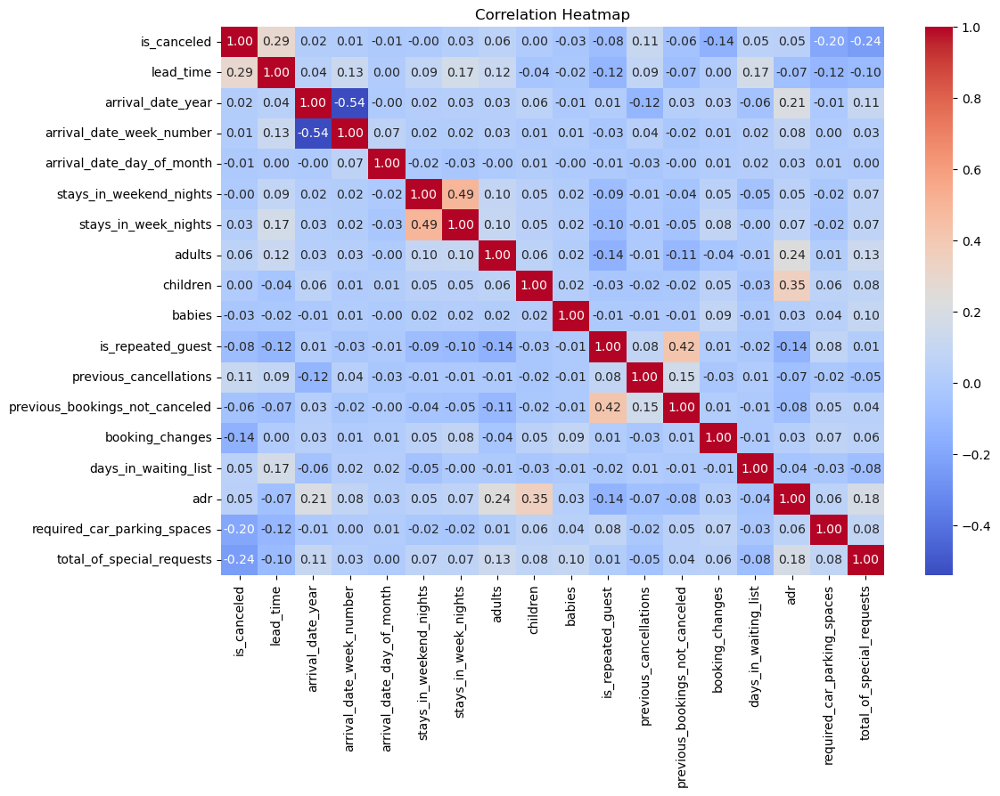

In [18]:
# Calculate correlation matrix
corr_matrix = df.corr()

# Create a heatmap for the correlation matrix
plt.figure(figsize=(12,8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()


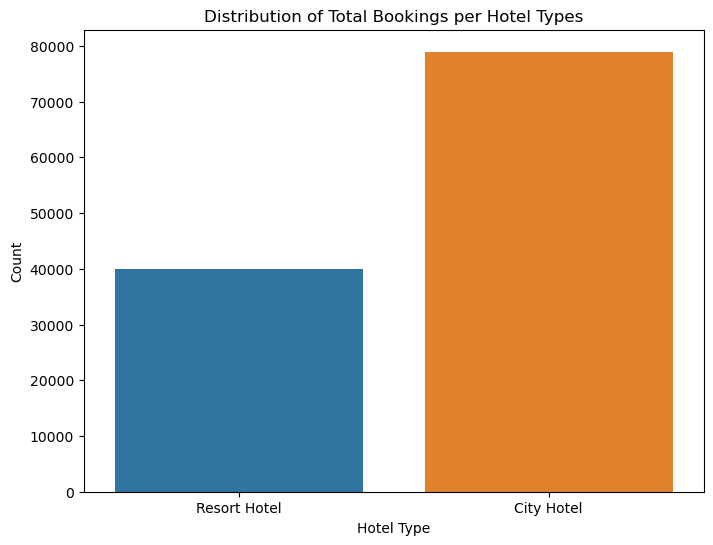

In [19]:
# Plot distribution of hotel types
plt.figure(figsize=(8,6))
sns.countplot(x='hotel', data=df)
plt.title('Distribution of Total Bookings per Hotel Types')
plt.xlabel('Hotel Type')
plt.ylabel('Count')
plt.show()

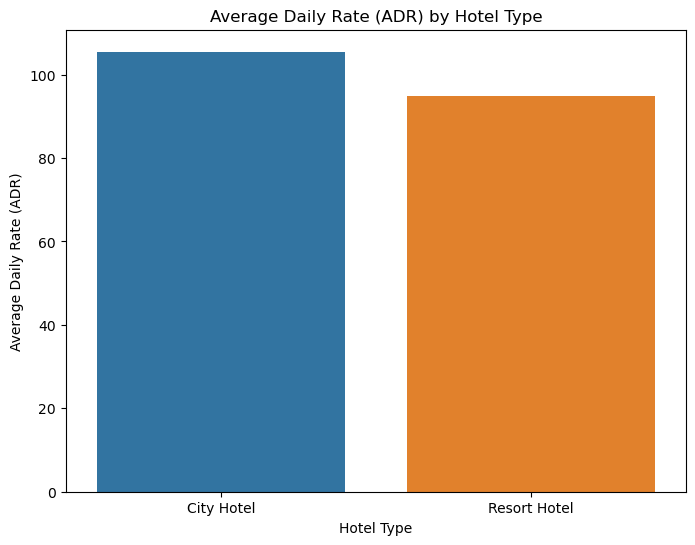

In [20]:
# Step 1: Calculate the mean ADR for each hotel type
hotel_adr_mean = df.groupby('hotel')['adr'].mean().reset_index()

# Step 2: Create the Seaborn bar plot
plt.figure(figsize=(8, 6))
sns.barplot(x='hotel', y='adr', data=hotel_adr_mean)
plt.title('Average Daily Rate (ADR) by Hotel Type')
plt.xlabel('Hotel Type')
plt.ylabel('Average Daily Rate (ADR)')
plt.show()

In [21]:
# Average Daily Rate vs Hotel
adr_vs_hotel = px.box(df, x="hotel", y="adr",color="hotel")
adr_vs_hotel.show()

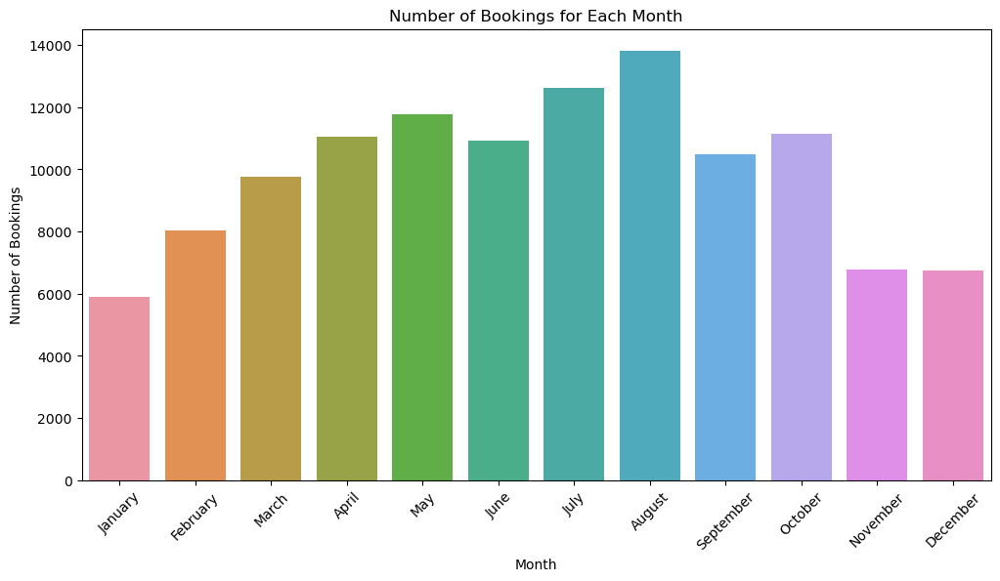

In [22]:
# Order of the months
months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

# Plot the number of bookings for each month
plt.figure(figsize=(12,6))
sns.countplot(x='arrival_date_month', data=df, order=months_order)
plt.title('Number of Bookings for Each Month')
plt.xlabel('Month')
plt.ylabel('Number of Bookings')
plt.xticks(rotation=45)
plt.show()

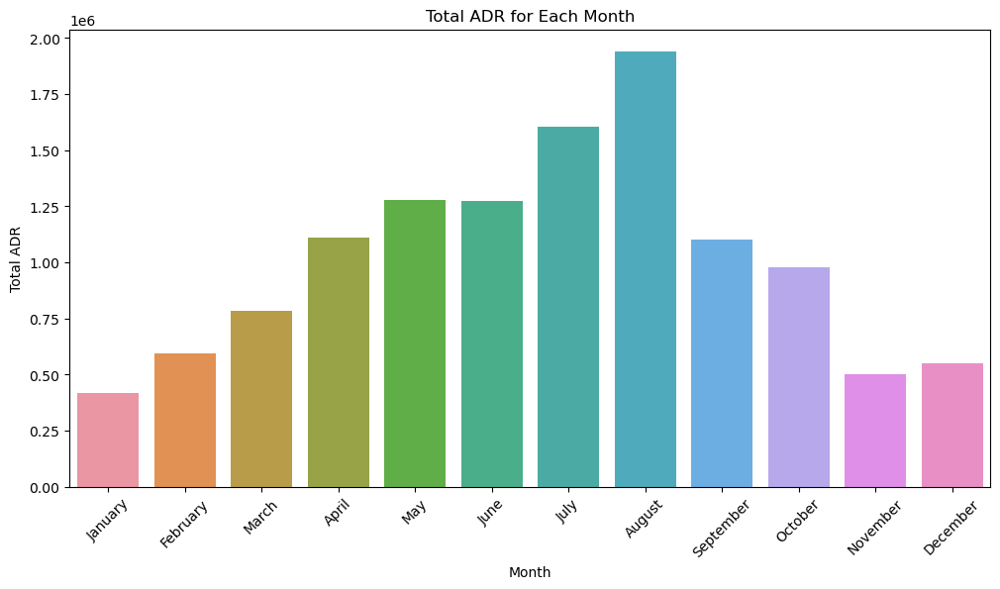

In [23]:
# Calculate the total ADR for each month
total_adr_month = df.groupby('arrival_date_month')['adr'].sum().reindex(months_order)

# Create a bar plot for total ADR in each month
plt.figure(figsize=(12,6))
sns.barplot(x=total_adr_month.index, y=total_adr_month.values)
plt.title('Total ADR for Each Month')
plt.xlabel('Month')
plt.ylabel('Total ADR')
plt.xticks(rotation=45)
plt.show()

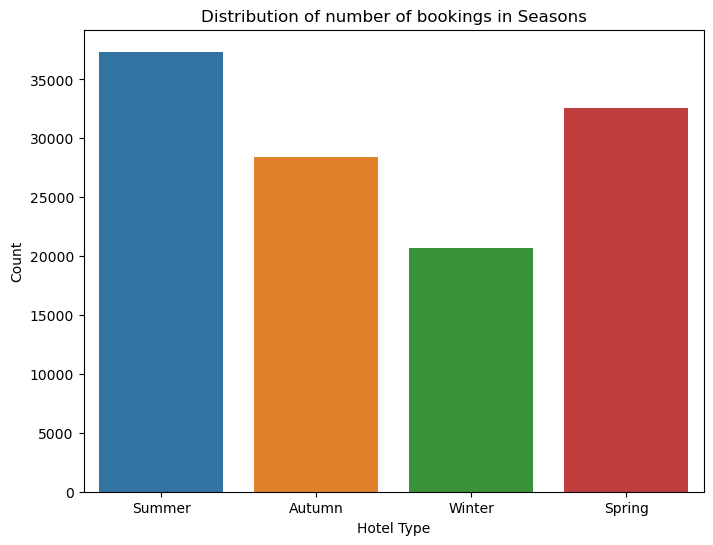

In [24]:
# Plot distribution of number of bookings in season
plt.figure(figsize=(8,6))
sns.countplot(x='season', data=df)
plt.title('Distribution of number of bookings in Seasons')
plt.xlabel('Hotel Type')
plt.ylabel('Count')
plt.show()

In [25]:
# Average Daily Rate vs Season
fig = px.box(df, x="season", y="adr",title='Boxplot for ADR vs Season',color = 'season')
fig.show()


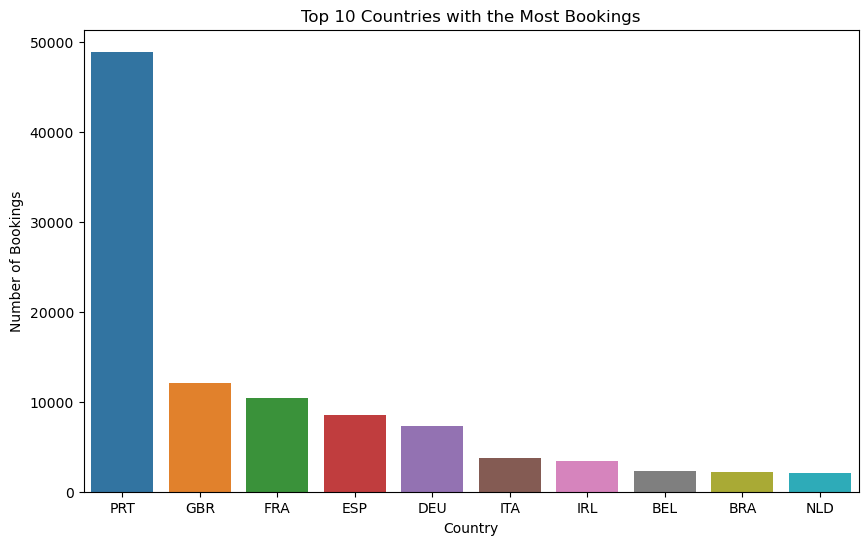

In [26]:
# Top 10 countries with the most bookings
top_countries = df['country'].value_counts().head(10)

# Plot the top 10 countries
plt.figure(figsize=(10,6))
sns.barplot(x=top_countries.index, y=top_countries.values)
plt.title('Top 10 Countries with the Most Bookings')
plt.xlabel('Country')
plt.ylabel('Number of Bookings')
plt.show()


the majority of bookings are from guests in Portugal (PRT), followed by Great Britain (GBR), France (FRA), Spain (ESP), and Germany (DEU). The other countries in the top 10 are Ireland (IRL), Italy (ITA), Belgium (BEL), Brazil (BRA), and the Netherlands (NLD).

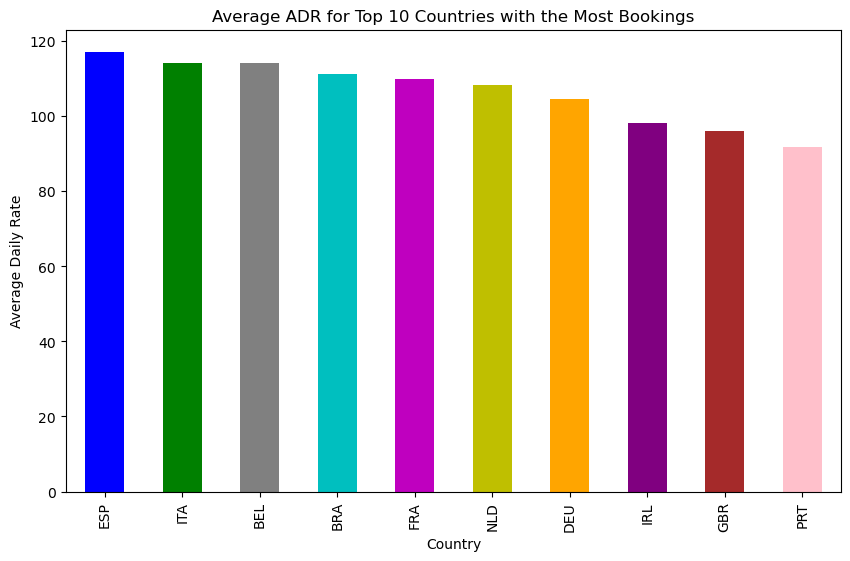

In [27]:
# Top 10 countries with the most bookings
top_countries_adr = df['country'].value_counts().index[:10]

# Filter the dataframe to include only these countries
df_top_countries_adr = df[df['country'].isin(top_countries_adr)]

# Calculate the average ADR for each country
avg_adr_countries = df_top_countries_adr.groupby('country')['adr'].mean()

# Plot the average ADR
colors = ['b', 'g', 'grey', 'c', 'm', 'y', 'orange', 'purple', 'brown', 'pink']
avg_adr_countries.sort_values(ascending=False).plot(kind='bar', figsize=(10, 6), color=colors)
plt.title('Average ADR for Top 10 Countries with the Most Bookings')
plt.xlabel('Country')
plt.ylabel('Average Daily Rate')
plt.show()


Guests from Portugal (PRT), which has the highest number of bookings, have a lower average ADR compared to some other countries.

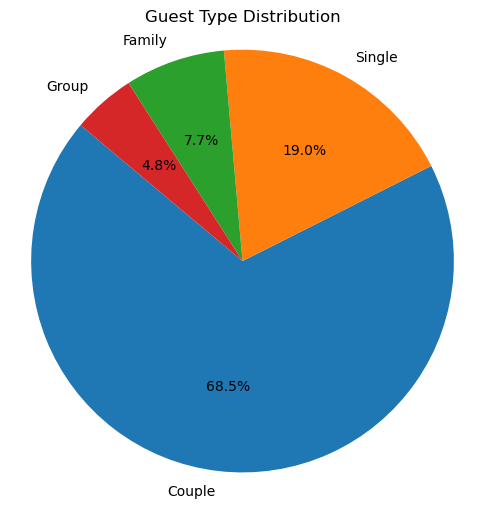

In [28]:
# Step 1: Get the count of each guest type
guest_type_counts = df['guest_type'].value_counts()

# Step 2: Create the pie chart
plt.figure(figsize=(6, 6))
plt.pie(guest_type_counts, labels=guest_type_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Guest Type Distribution')
plt.axis('equal')  # Equal aspect ratio ensures the pie chart is circular.
plt.show()

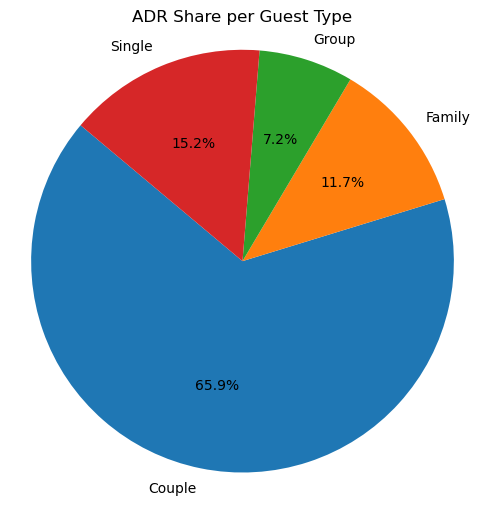

In [29]:
# Step 1: Get the sum of ADR for each guest type
total_adr_per_category = df.groupby('guest_type')['adr'].sum()

# Step 2: Create the pie chart
plt.figure(figsize=(6, 6))
plt.pie(total_adr_per_category, labels=total_adr_per_category.index, autopct='%1.1f%%', startangle=140)
plt.title('ADR Share per Guest Type')
plt.axis('equal')  # Equal aspect ratio ensures the pie chart is circular.
plt.show()

In [30]:
# Create the plot
adr_vs_category_box = px.box(df, x="guest_type", y="adr", title='ADR Share per guest_type', color = "guest_type")

# Display the plot
adr_vs_category_box.show()

In [31]:
# Preferred day, month, and season for each guest type
preferred_day = df.groupby('guest_type')['day_of_week'].agg(pd.Series.mode)
preferred_month = df.groupby('guest_type')['arrival_date_month'].agg(pd.Series.mode)
preferred_season = df.groupby('guest_type')['season'].agg(pd.Series.mode)

preferred_day, preferred_month, preferred_season

(guest_type
 Couple      Friday
 Family    Saturday
 Group       Friday
 Single      Monday
 Name: day_of_week, dtype: object,
 guest_type
 Couple     August
 Family     August
 Group      August
 Single    October
 Name: arrival_date_month, dtype: object,
 guest_type
 Couple    Summer
 Family    Summer
 Group     Summer
 Single    Spring
 Name: season, dtype: object)

# Cancellation

In [32]:
print('-'*30)
print('Total Bookings canceled')
print('-'*30)
print(df.is_canceled.value_counts())
print('-'*30)
print('Cancelation percent in hotels')
print('-'*30)
print(df.is_canceled.value_counts(normalize=True))

------------------------------
Total Bookings canceled
------------------------------
0    74872
1    44115
Name: is_canceled, dtype: int64
------------------------------
Cancelation percent in hotels
------------------------------
0    0.629245
1    0.370755
Name: is_canceled, dtype: float64


In [33]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,season,day_of_week,guest_type
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,0,Transient,0.0,0,0,Check-Out,2015-07-01,Summer,Wednesday,Couple
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,0,Transient,0.0,0,0,Check-Out,2015-07-01,Summer,Wednesday,Couple
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,0,Transient,75.0,0,0,Check-Out,2015-07-02,Summer,Wednesday,Single
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,0,Transient,75.0,0,0,Check-Out,2015-07-02,Summer,Wednesday,Single
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,0,Transient,98.0,0,1,Check-Out,2015-07-03,Summer,Wednesday,Couple


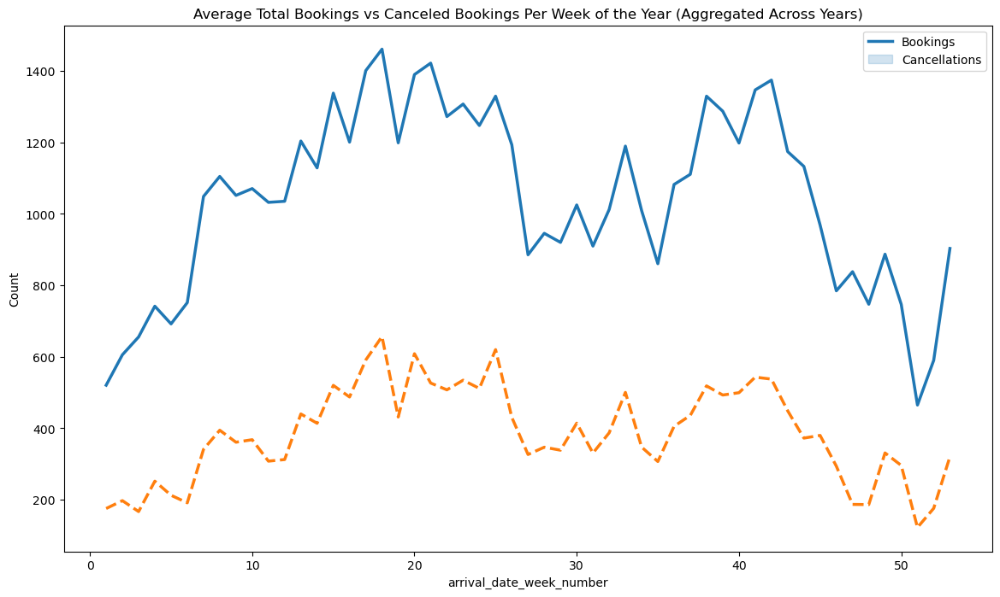

In [34]:
# Create a new column for total bookings
df['total_bookings'] = 1

# Create the weekly dataframe
df_weekly = df.groupby(['arrival_date_year', 'arrival_date_week_number']).agg({'is_canceled': 'sum', 'total_bookings': 'count'}).reset_index()

# Create the monthly dataframe
df_monthly = df.groupby(['arrival_date_year', 'arrival_date_month']).agg({'is_canceled': 'sum', 'total_bookings': 'count'}).reset_index()

# Aggregate the data across all years
df_weekly_agg = df_weekly.groupby('arrival_date_week_number').agg({'is_canceled': 'mean', 'total_bookings': 'mean'}).reset_index()
df_monthly_agg = df_monthly.groupby('arrival_date_month').agg({'is_canceled': 'mean', 'total_bookings': 'mean'}).reset_index()

# Plot the weekly trend
plt.figure(figsize=(14, 8))
sns.lineplot(x='arrival_date_week_number', y='total_bookings', data=df_weekly_agg, linewidth=2.5)
sns.lineplot(x='arrival_date_week_number', y='is_canceled', data=df_weekly_agg, linewidth=2.5, linestyle='--')
plt.title('Average Total Bookings vs Canceled Bookings Per Week of the Year (Aggregated Across Years)')
plt.ylabel('Count')
plt.legend(['Bookings', 'Cancellations'])
plt.show()



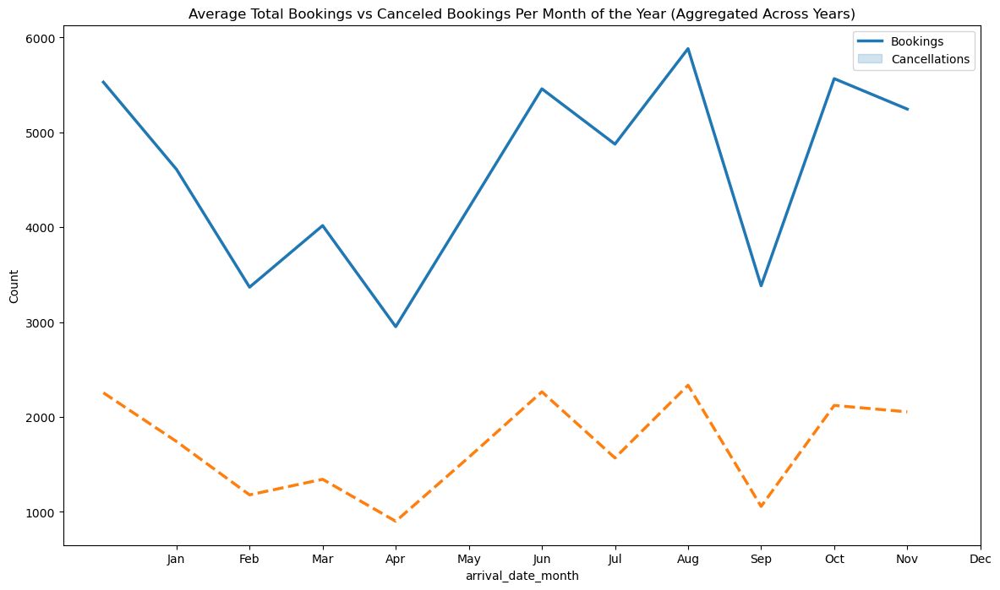

In [35]:
# Plot the monthly trend
plt.figure(figsize=(14, 8))
sns.lineplot(x='arrival_date_month', y='total_bookings', data=df_monthly_agg, linewidth=2.5)
sns.lineplot(x='arrival_date_month', y='is_canceled', data=df_monthly_agg, linewidth=2.5, linestyle='--')
plt.title('Average Total Bookings vs Canceled Bookings Per Month of the Year (Aggregated Across Years)')
plt.ylabel('Count')
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend(['Bookings', 'Cancellations'])
plt.show()

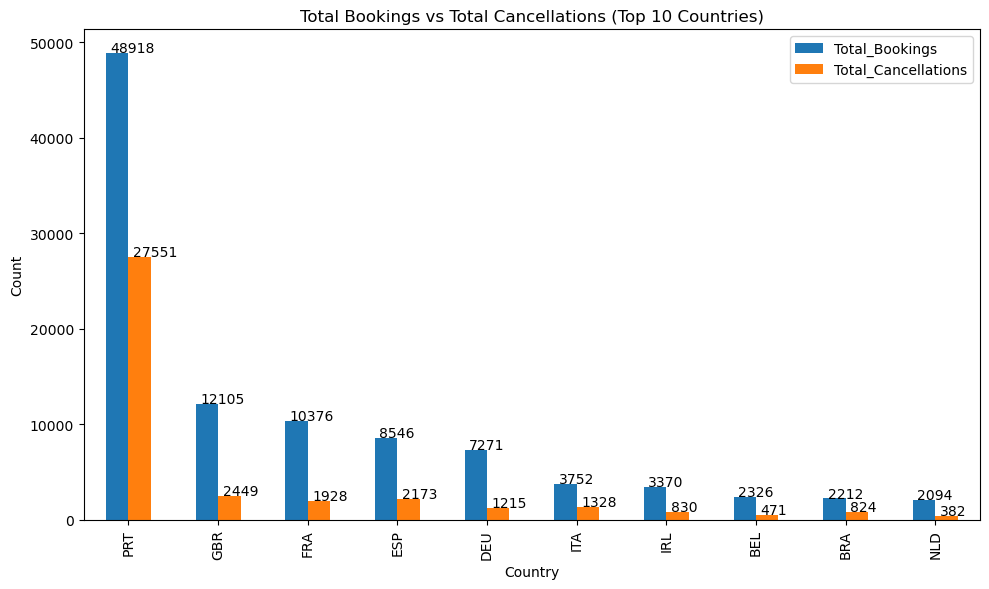

In [36]:
# Calculate the number and proportion of cancellations for each country
country_cancellations = df[df['is_canceled'] == 1]['country'].value_counts()
country_cancellations_proportion = df[df['is_canceled'] == 1]['country'].value_counts(normalize=True)

# Calculate the total number of bookings for each country
country_bookings = df['country'].value_counts()

# Select the top 10 countries in terms of total bookings
top_countries_bookings = country_bookings[:10]
top_countries_cancellations = country_cancellations[top_countries_bookings.index]

# Create a new DataFrame for plotting
top_countries_df = pd.DataFrame({
    'Total_Bookings': top_countries_bookings,
    'Total_Cancellations': top_countries_cancellations
})

# Plot the total number of bookings vs total cancellations
ax = top_countries_df.plot(kind='bar', figsize=(10, 6))
ax.set_title('Total Bookings vs Total Cancellations (Top 10 Countries)')
ax.set_xlabel('Country')
ax.set_ylabel('Count')

# Add values on top of the bars
for i in ax.patches:
    ax.text(i.get_x() + 0.05, i.get_height() + 100, str(i.get_height()), fontsize=10)

plt.tight_layout()
plt.show()


In [37]:
# Select the top 10 countries in terms of total bookings
top_countries = country_bookings[:10].index

# Filter the data for the top 10 countries
top_countries_data = df[df['country'].isin(top_countries)]

# Calculate the total number of bookings and cancellations for the top 10 countries
total_bookings_top_countries = top_countries_data['country'].value_counts()
total_cancellations_top_countries = top_countries_data[top_countries_data['is_canceled'] == 1]['country'].value_counts()

# Calculate the percentage of bookings and cancellations for the top 10 countries
booking_percent_top_countries = total_bookings_top_countries / total_bookings_top_countries.sum()
cancellation_percent_top_countries = total_cancellations_top_countries / total_cancellations_top_countries.sum()

# Print the results
print('Booking Percent for Top 10 Countries')
print(booking_percent_top_countries)
print('-'*30)
print('Total Cancellations for Top 10 Countries')
print('-'*30)
print(cancellation_percent_top_countries)
print('-'*30)

Booking Percent for Top 10 Countries
PRT    0.484481
GBR    0.119887
FRA    0.102763
ESP    0.084639
DEU    0.072011
ITA    0.037160
IRL    0.033376
BEL    0.023037
BRA    0.021907
NLD    0.020739
Name: country, dtype: float64
------------------------------
Total Cancellations for Top 10 Countries
------------------------------
PRT    0.703711
GBR    0.062553
ESP    0.055503
FRA    0.049245
ITA    0.033920
DEU    0.031034
IRL    0.021200
BRA    0.021047
BEL    0.012030
NLD    0.009757
Name: country, dtype: float64
------------------------------


### 'PRT' (Portugal) has a relatively higher proportion of cancellations compared to other countries.

### Portugal (PRT) makes up 48.2% of the total bookings and 70.28% of the total cancellations among these countries.

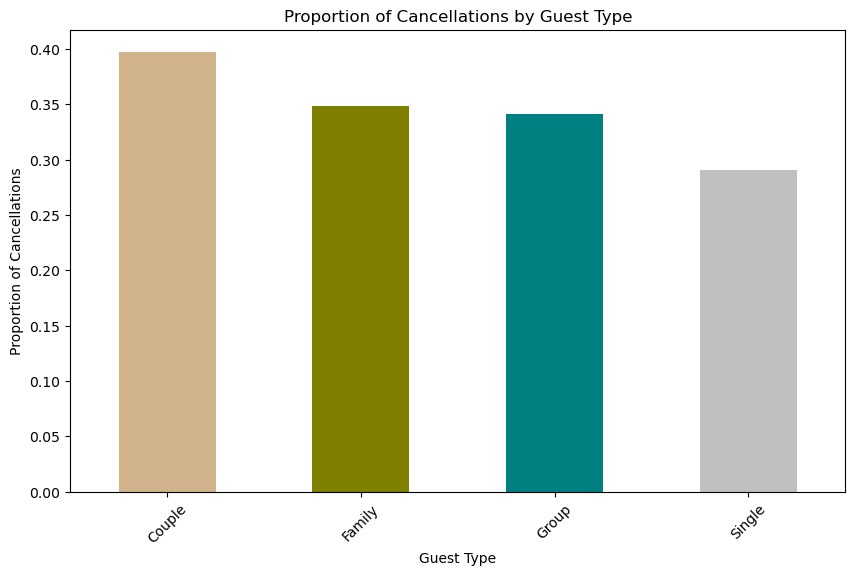

In [38]:
# Calculate the proportion of bookings that were cancelled for each guest type
guest_cancellations = df.groupby('guest_type')['is_canceled'].mean()

# Plot the results
plt.figure(figsize=(10, 6))
colors = ['Tan', 'Olive', 'Teal', 'Silver', 'purple']
guest_cancellations.plot(kind='bar', color=colors)
plt.title('Proportion of Cancellations by Guest Type')
plt.xlabel('Guest Type')
plt.ylabel('Proportion of Cancellations')
plt.xticks(rotation=45)
plt.show()


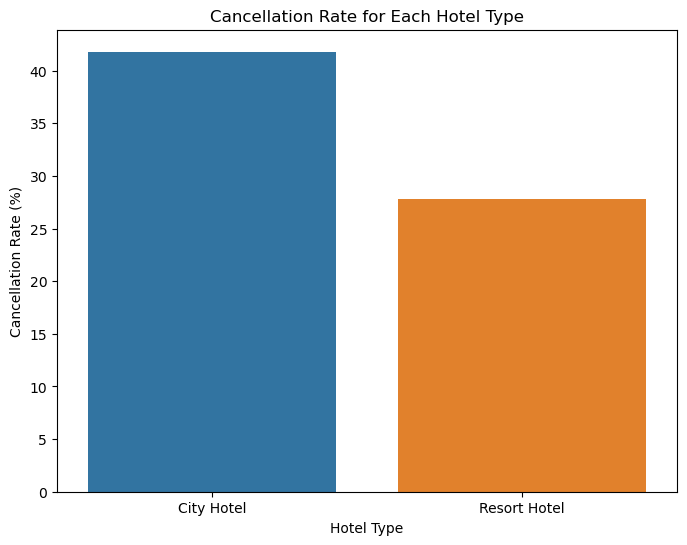

In [39]:
# Calculate cancellation rate for each hotel type
cancellation_rates = df.groupby('hotel')['is_canceled'].mean()

# Convert to percentage and plot
cancellation_rates = cancellation_rates * 100

# Plot cancellation rates
plt.figure(figsize=(8,6))
sns.barplot(x=cancellation_rates.index, y=cancellation_rates.values)
plt.title('Cancellation Rate for Each Hotel Type')
plt.xlabel('Hotel Type')
plt.ylabel('Cancellation Rate (%)')
plt.show()

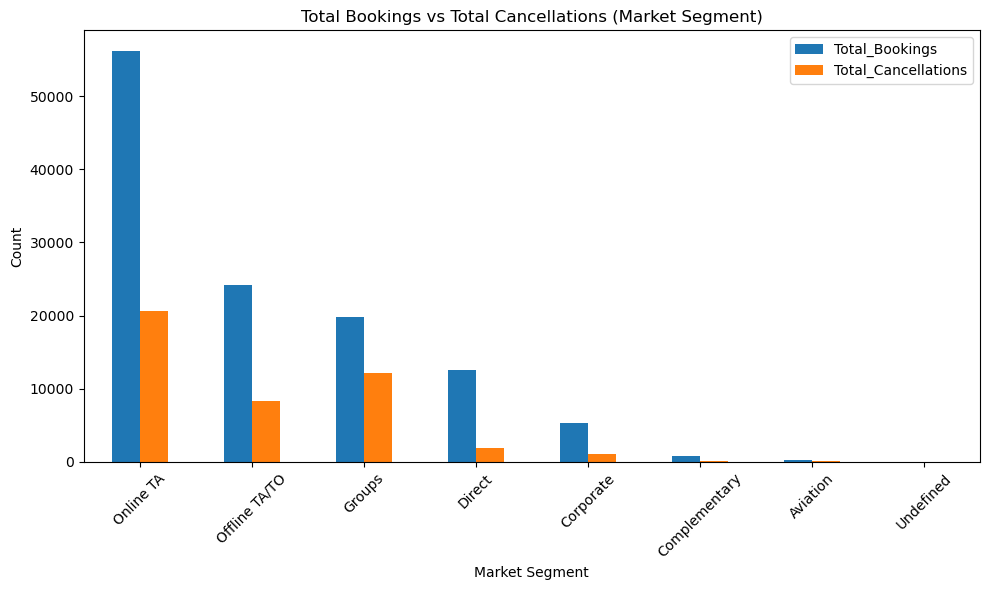

In [40]:
# Calculate the total number of bookings and cancellations for each market segment
market_segment_bookings = df['market_segment'].value_counts()
market_segment_cancellations = df[df['is_canceled'] == 1]['market_segment'].value_counts()

# Create a new DataFrame for plotting
market_segment_df = pd.DataFrame({
    'Total_Bookings': market_segment_bookings,
    'Total_Cancellations': market_segment_cancellations
}).sort_values(by='Total_Bookings', ascending=False)

# Plot the total number of bookings vs total cancellations
ax = market_segment_df.plot(kind='bar', figsize=(10, 6))
ax.set_title('Total Bookings vs Total Cancellations (Market Segment)')
ax.set_xlabel('Market Segment')
ax.set_ylabel('Count')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()


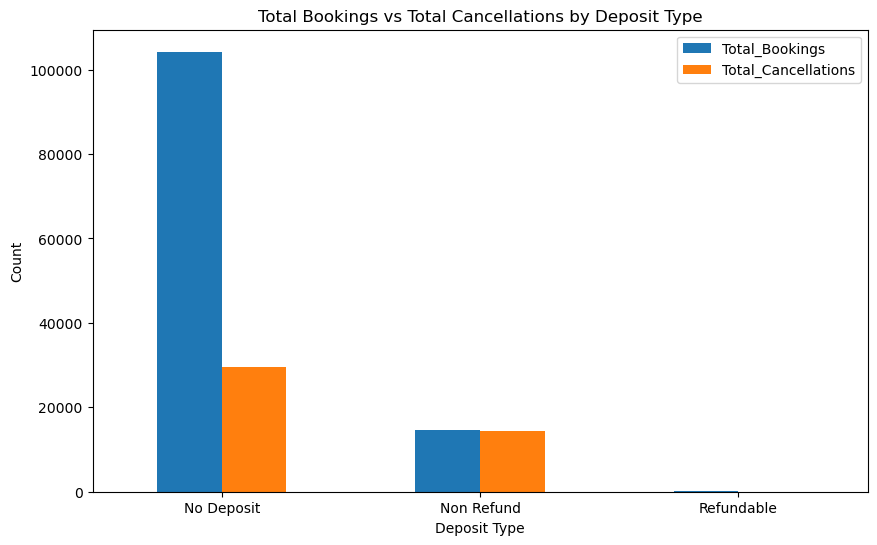

,Total_Bookings,Total_Cancellations,Cancellation_Percent
No Deposit,104238,29585,28.382164
Non Refund,14587,14494,99.362446
Refundable,162,36,22.222222


In [41]:
# Calculate total bookings for each deposit type
deposit_total_bookings = df['deposit_type'].value_counts()

# Calculate total cancellations for each deposit type
deposit_total_cancellations = df[df['is_canceled'] == 1]['deposit_type'].value_counts()

# Combine total bookings and total cancellations into one dataframe
deposit_data = pd.DataFrame({'Total_Bookings': deposit_total_bookings, 
                             'Total_Cancellations': deposit_total_cancellations})

# Calculate cancellation percent for each deposit type
deposit_data['Cancellation_Percent'] = (deposit_data['Total_Cancellations'] / deposit_data['Total_Bookings']) * 100

# Plot total bookings and total cancellations for each deposit type in one chart
deposit_data[['Total_Bookings', 'Total_Cancellations']].plot(kind='bar', figsize=(10, 6))
plt.title('Total Bookings vs Total Cancellations by Deposit Type')
plt.xlabel('Deposit Type')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()

deposit_data

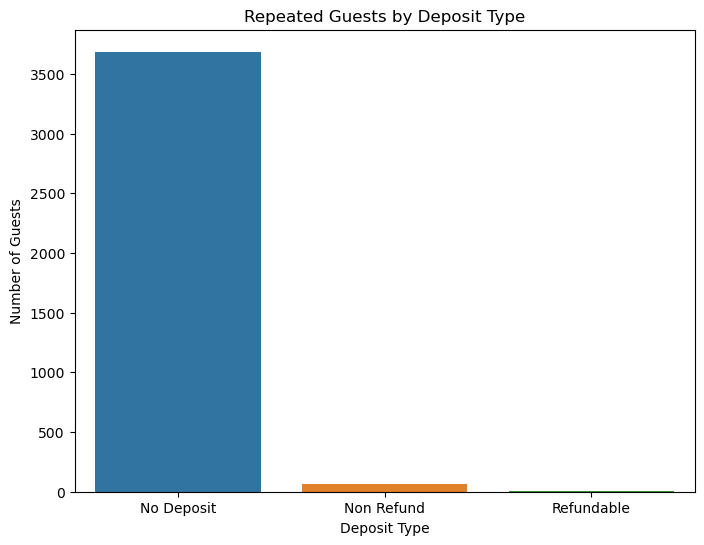

,Total_Bookings,Total_Cancellations,Cancellation_Percent,Total_Repeated_Guests,Repeated_Guest_Percent
No Deposit,104238,29585,28.382164,3686,3.536138
Non Refund,14587,14494,99.362446,64,0.438747
Refundable,162,36,22.222222,4,2.469136


In [42]:
# Filter data for repeated guests
repeated_guests_data = df[df['is_repeated_guest'] == 1]

# Count the number of repeated guests for each deposit type
repeated_guests_by_deposit = repeated_guests_data['deposit_type'].value_counts()


# Calculate repeated guest percent for each deposit type
deposit_data['Total_Repeated_Guests'] = repeated_guests_by_deposit
deposit_data['Repeated_Guest_Percent'] = (deposit_data['Total_Repeated_Guests'] / deposit_data['Total_Bookings']) * 100

# Plot the number of repeated guests for each deposit type
plt.figure(figsize=(8, 6))
sns.barplot(x=repeated_guests_by_deposit.index, y=repeated_guests_by_deposit.values)
plt.title('Repeated Guests by Deposit Type')
plt.xlabel('Deposit Type')
plt.ylabel('Number of Guests')
plt.show()

deposit_data

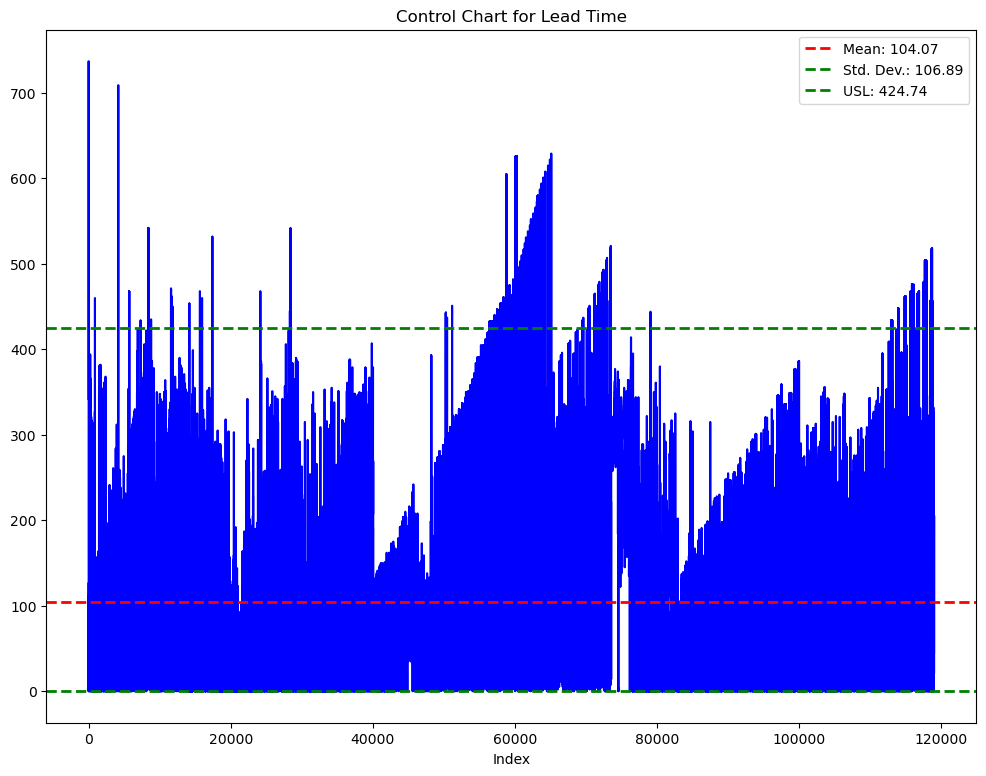

In [43]:
# Recalculating necessary parameters for the control chart
mean_lead_time = df['lead_time'].mean()
std_dev_lead_time = df['lead_time'].std()
USL_lead_time = mean_lead_time + 3 * std_dev_lead_time
LSL_lead_time = max(0, mean_lead_time - 3 * std_dev_lead_time)

# Create a simplified control chart for lead_time
fig, ax = plt.subplots(figsize=(12, 9))

# Plot data points
df['lead_time'].plot(kind='line', ax=ax, title='Control Chart for Lead Time', color='b')

# Plot mean, USL and LSL for lead_time
mean_line = ax.axhline(mean_lead_time, color='r', linestyle='dashed', linewidth=2)
USL_line = ax.axhline(USL_lead_time, color='g', linestyle='dashed', linewidth=2)
LSL_line = ax.axhline(LSL_lead_time, color='g', linestyle='dashed', linewidth=2)

# Add labels and legend
ax.set_xlabel('Index')
ax.legend([mean_line, USL_line, LSL_line], [f'Mean: {mean_lead_time:.2f}', f'Std. Dev.: {std_dev_lead_time:.2f}', f'USL: {USL_lead_time:.2f}'], loc='upper right')

plt.show()


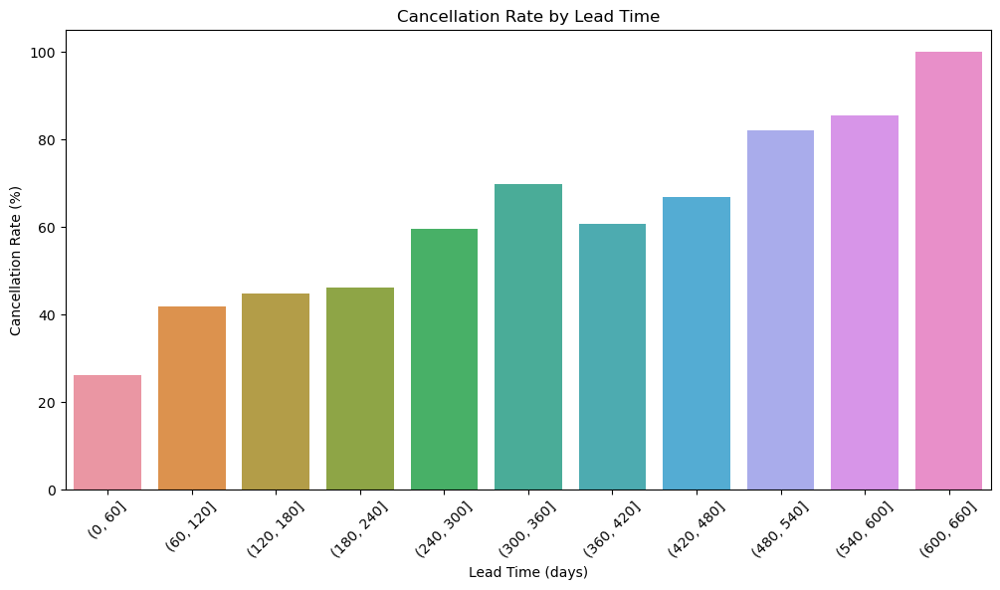

In [44]:
# Define bins for lead time
bins = [0, 60, 120, 180, 240, 300, 360, 420, 480, 540, 600, 660]

# Add a new column for lead time category
df['lead_time_category'] = pd.cut(df['lead_time'], bins)

# Calculate overall cancellation rate for each lead time category
cancellation_rates = df.groupby('lead_time_category')['is_canceled'].mean() * 100

# Plot cancellation rates
plt.figure(figsize=(12, 6))
sns.barplot(x=cancellation_rates.index, y=cancellation_rates.values)
plt.title('Cancellation Rate by Lead Time')
plt.xlabel('Lead Time (days)')
plt.ylabel('Cancellation Rate (%)')
plt.xticks(rotation=45)
plt.show()

### Previous graph suggests that there is a positive relationship between lead time and cancellation. the longer the time between booking and actual stay, the more likely the booking is to be cancelled.

We will run a Hypothesis test to find if there is an association between 'lead time' and 'cancellation'. In other words, the cancellation of a booking depends on the lead time.

H0: The 'lead_time_category' and 'is_canceled' are independent.

H1: The 'lead_time_category' and 'is_canceled' are not independent.

In [45]:
# Create a contingency table
contingency_table = pd.crosstab(df['lead_time'], df['is_canceled'])

# Perform Chi-Square Test
chi2, p, dof, expected = chi2_contingency(contingency_table)

chi2, p

(18123.22034174444, 0.0)

The Chi-square test statistic is approximately 18123.22 and the p-value is 0.0.

A larger Chi-Square statistic indicates a greater difference between the observed and expected frequencies, and thus a stronger relationship between the variables.

In hypothesis testing, if the p-value is less than or equal to the significance level (usually 0.05), we reject the null hypothesis. In this case, the p-value is less than 0.05, so we reject the null hypothesis (H0: The lead time does not affect the cancellation rate).

Therefore, we have statistical evidence to support the alternative hypothesis (H1: The lead time affects the cancellation rate). This result is consistent with our earlier observation from the bar chart, indicating that the cancellation rate increases with lead time.

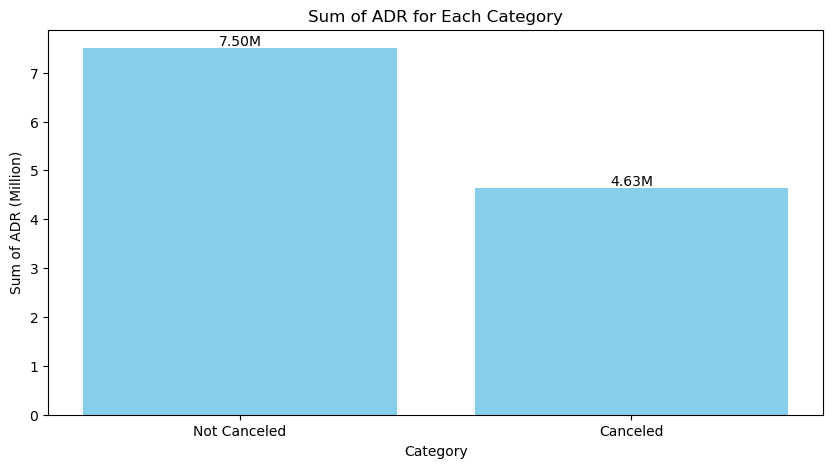

In [46]:
# Group by 'is_canceled' and calculate the sum of ADR for each group
adr_sum_grouped = df.groupby('is_canceled')['adr'].sum().reset_index()
adr_sum_grouped['is_canceled'] = adr_sum_grouped['is_canceled'].map({0: 'Not Canceled', 1: 'Canceled'})

# Create a bar plot for the sum of ADR
plt.figure(figsize=(10, 5))
bars = plt.bar(adr_sum_grouped['is_canceled'], adr_sum_grouped['adr'] / 1000000, color='skyblue')
plt.title('Sum of ADR for Each Category')
plt.xlabel('Category')
plt.ylabel('Sum of ADR (Million)')

# Add data value on top of each bar
for bar in bars:
    yval = round(bar.get_height(), 2)
    plt.text(bar.get_x() + bar.get_width() / 2, yval, f'{yval:.2f}M', ha='center', va='bottom')

plt.show()


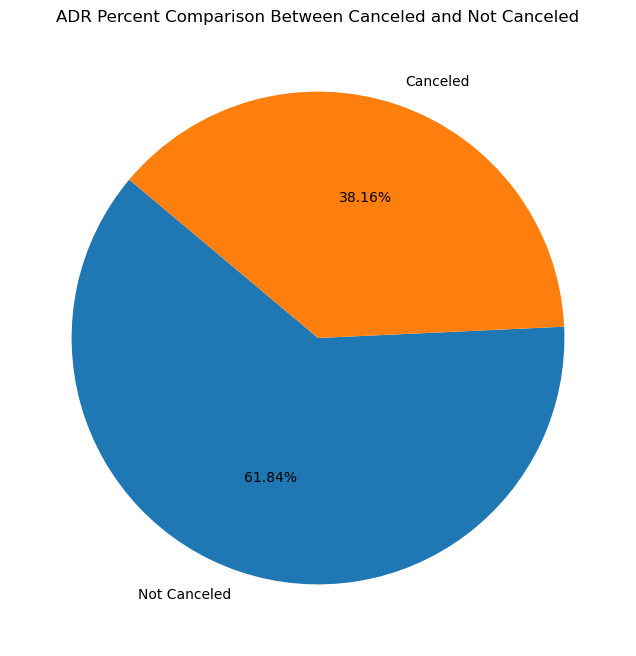

In [47]:
# Define the data for the pie chart
adr_sum_total = df['adr'].sum()
adr_sum_not_canceled = df.loc[df['is_canceled'] == 0, 'adr'].sum()
adr_sum_canceled = df.loc[df['is_canceled'] == 1, 'adr'].sum()

adr_percent_values = [adr_sum_not_canceled / adr_sum_total * 100, adr_sum_canceled / adr_sum_total * 100]
categories = ['Not Canceled', 'Canceled']

# Create a pie chart for the ADR percent comparison
plt.figure(figsize=(8, 8))
plt.pie(adr_percent_values, labels=categories, autopct='%1.2f%%', startangle=140)
plt.title('ADR Percent Comparison Between Canceled and Not Canceled')
plt.show()

In [48]:
# Calculate the sum of ADR for not canceled and canceled bookings
adr_sum_not_canceled = df[df['is_canceled'] == 0]['adr'].sum()
adr_sum_canceled = df[df['is_canceled'] == 1]['adr'].sum()

# Simulate conversion of canceled bookings
adr_sum_canceled_converted_25 = adr_sum_not_canceled + adr_sum_canceled * 0.25
adr_sum_canceled_converted_50 = adr_sum_not_canceled + adr_sum_canceled * 0.5
adr_sum_canceled_converted_75 = adr_sum_not_canceled + adr_sum_canceled * 0.75

# Create a DataFrame to store these values
simulation_df = pd.DataFrame({
    'Scenario': ['Actual Not Canceled', 'Convert 25% of Canceled (+1.16 million)', 
                 'Convert 50% of Canceled (+2.32 million)', 'Convert 75% of Canceled (+3.48 million)'],
    'Sum ADR (in million)': [adr_sum_not_canceled / 1e6, adr_sum_canceled_converted_25 / 1e6,
                             adr_sum_canceled_converted_50 / 1e6, adr_sum_canceled_converted_75 / 1e6]})
    
simulation_df

,Scenario,Sum ADR (in million)
0,Actual Not Canceled,7.502945
1,Convert 25% of Canceled (+1.16 million),8.660317
2,Convert 50% of Canceled (+2.32 million),9.817688
3,Convert 75% of Canceled (+3.48 million),10.975060


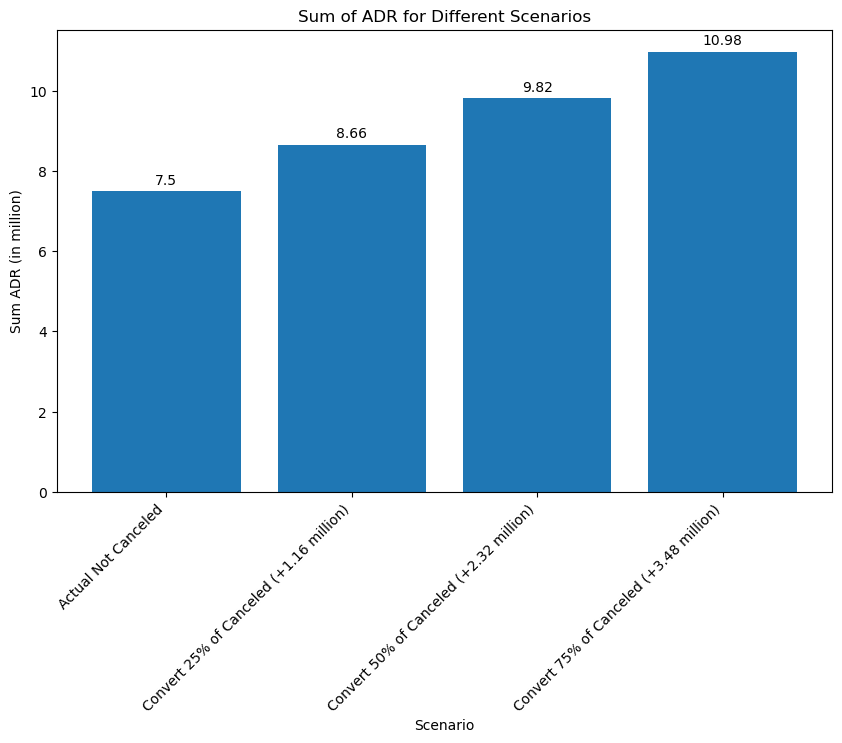

In [49]:
# Create a bar chart to visualize the data
plt.figure(figsize=(10, 6))
bars = plt.bar(simulation_df['Scenario'], simulation_df['Sum ADR (in million)'])
plt.title('Sum of ADR for Different Scenarios')
plt.xlabel('Scenario')
plt.ylabel('Sum ADR (in million)')
plt.xticks(rotation=45, ha='right')

# Add data values on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.1, round(yval, 2), ha='center', va='bottom')

plt.show()


From the chart, you can clearly see the potential increase in the sum of ADR if a certain percentage of the canceled bookings were converted to not canceled. This can provide an estimate of the potential revenue increase if the hotel can reduce the cancellation rate.

#### As we can see, there is significant potential to increase revenue by reducing the cancellation rate. Converting even a quarter of the cancelled bookings could result in an increase in total ADR by about 1.16 million. The potential increase grows with the conversion rate, reaching about 3.48 million when 75% of cancelled bookings are converted. 

-----------------------------------------------------------------------------------------------------------------------------------------


 Based on the cancellation analysis, hypothesis test results, and Average Daily Rate (ADR) for canceled bookings we've conducted, we can suggest several strategies to mitigate the cancellation rate:

##### 1- Targeted Marketing for High Cancellation Countries:
As Portugal accounts for a large proportion of both total bookings and cancellations, it could be beneficial to focus on this market to understand the reasons behind the high cancellation rate. This could involve surveys or market research to identify any issues or concerns Portuguese customers might have, and then addressing those issues in your marketing and service offerings.

##### 2- Reducing Lead Time:
The Chi-square test indicated a significant relationship between lead time and cancellation rate. Therefore, strategies to reduce lead time could help decrease cancellations. This could involve offering incentives for last-minute bookings or implementing a dynamic pricing model where prices decrease as the booking date approaches.

##### 3- Investing in Cancellation Prevention:
The analysis of ADR for canceled bookings showed that reducing the cancellation rate could lead to a significant increase in revenue. This indicates that investing in cancellation prevention could be highly profitable. This could involve improving the booking process, enhancing customer service, or offering flexible cancellation policies to prevent customers from cancelling their bookings in the first place.

##### 4- Offering Flexible Plans:
Offering more flexible booking options may decrease the likelihood of cancellations. This could include options such as free cancellation up to a certain number of days before the stay, or the option to reschedule the booking without additional fees.

##### 5- Loyalty Programs:
Implementing a loyalty program could also help reduce cancellation rates. If customers feel valued and receive additional benefits from a loyalty program, they may be less likely to cancel their bookings.